# Imports

In [1]:
import cv2 as cv
import shutil
import os
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import pandas as pd
import time
import requests
import zipfile


# classification

from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from keras.utils.np_utils import to_categorical
from keras.layers import Dropout, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D
import cv2
from sklearn.model_selection import train_test_split
import pickle
import random
from keras.preprocessing.image import ImageDataGenerator

# Load the data

In [3]:
mypath = 'tsrd-train'


# check if file 'TsignRecgTrain4170Annotation.txt' exists

if os.path.isfile('TsignRecgTrain4170Annotation.txt'):
    print('File exists')

else :
    print('Downloading annotation file...')
    f_annotation = "http://www.nlpr.ia.ac.cn/pal/trafficdata/TSRD-Train%20Annotation.zip"
    r = requests.get(f_annotation, stream=True)
    
    with open("TSRD-Train Annotation.zip", "wb") as f: shutil.copyfileobj(r.raw, f)
    with zipfile.ZipFile("tsrd-train Annotation.zip","r") as zip_ref: zip_ref.extractall(".")
    print("Downloaded annotation file\n")
    


# check if folder 'tsrd-train' exists
            
if os.path.exists(mypath):
    print('Directory exists')
    # check if file contains 4170 images
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    if len(onlyfiles) >= 4170:
        print('Directory contains 4170 images')
    else :
        print('Downloading images...')
        f_images = "http://www.nlpr.ia.ac.cn/pal/trafficdata/tsrd-train.zip"
        r = requests.get(f_image, stream=True)
        with open("tsrd-train.zip", "wb") as f: shutil.copyfileobj(r.raw, f)
        with zipfile.ZipFile("tsrd-train.zip","r") as zip_ref: zip_ref.extractall("./tsrd-train")
        print("Downloaded image file")



File exists
Directory exists
Directory contains 4170 images


In [4]:
# read annotation file

annotation = 'TsignRecgTrain4170Annotation.txt'

header = ['filename', 'width', 'height', 'x1', 'y1', 'x2', 'y2', 'class']
data = pd.read_csv(annotation, sep=';', header=None, index_col=False, names=header)

data.head()


,filename,width,height,x1,y1,x2,y2,class
0,000_0001.png,134,128,19,7,120,117,0
1,000_0002.png,165,151,23,12,149,138,0
2,000_0003.png,128,122,22,14,116,105,0
3,000_0010.png,80,73,14,8,67,63,0
4,000_0011.png,186,174,36,15,155,157,0


In [5]:
# print number of images

print('Number of images: ', len(data))
print('Number of classes: ', len(data['class'].unique()))

Number of images:  4170
Number of classes:  58


Text(0, 0.5, 'Count')

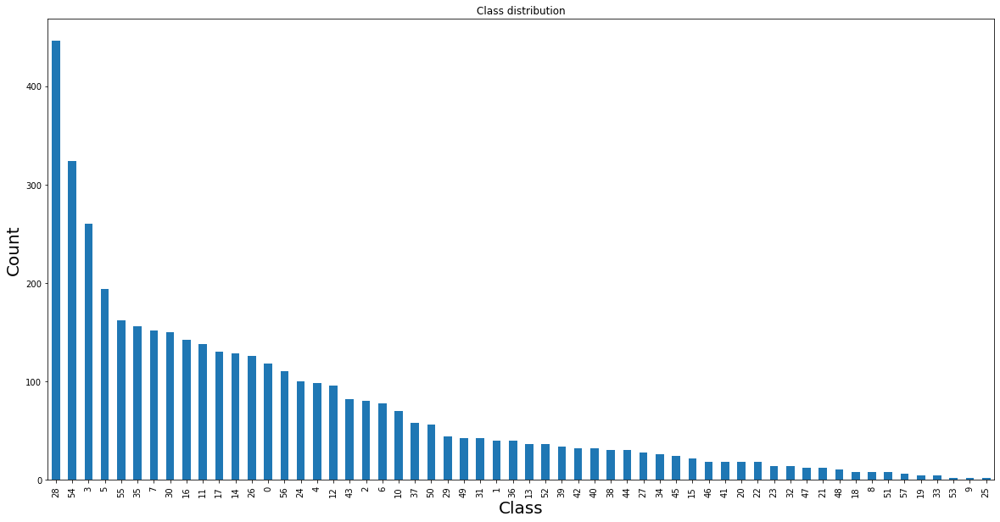

In [6]:
# plot class distribution

data['class'].value_counts().plot(kind='bar', figsize=(20,10))
plt.title('Class distribution')
plt.rcParams.update({'font.size': 20})
plt.xlabel('Class', fontsize=20)
plt.ylabel('Count', fontsize=20)


# Load image

idx = 985


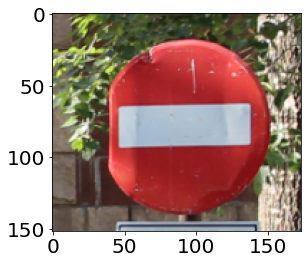

In [7]:
mypath = 'tsrd-train'

def load_image(idx=None, filename=None):
    """
    This function will help you to load an image from the dataset based on  filename or idx as index.
    if `idx` and `filename` are both None, a random image will be loaded.
    """
    
    if filename is None:
        idx = np.random.randint(0, len(data) - 1) if idx is None else idx
    else:
        idx = data[data['filename'] == filename].index[0]
    
    img = cv.imread(join(mypath, data.iloc[idx]['filename']))
    
    return img, idx

img, idx = load_image()
print(f'idx = {idx}')

plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
# plt.title(f"idx = {idx} class = {data.iloc[idx]['class']}")
plt.rcParams.update({'figure.figsize':(5,5)})
plt.show()

# Preprocess image

### Pre-defined functions

In [8]:
# Pre-defined function to plot image

def plot(img, title=None, img2=None, title2=None):
    
    if img2 is None:
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.Axes.set_axis_off(plt.gca())
    else:
        fig, ax = plt.subplots(1, 2, figsize=(20, 10))
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title(title)
        ax[1].imshow(img2, cmap='gray')
        ax[1].set_title(title2)
        ax[0].set_axis_off()
        ax[1].set_axis_off()
    
    plt.show()
    
def remove_small_blob(mask):
    contours, hierarchy = cv.findContours(mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        if cv.contourArea(cnt) < 12000:
            cv.drawContours(mask, [cnt], 0, 0, -1)
    return mask

def floodFill(mask):
    im_th = cv.threshold(mask, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]
    im_floodfill = im_th.copy()
    h, w = im_th.shape[:2]
    mask = np.zeros((h+2, w+2), np.uint8)
    cv.floodFill(im_floodfill, mask, (0, 0), 255)
    im_floodfill_inv = cv.bitwise_not(im_floodfill)
    mask = im_th | im_floodfill_inv
    return mask
    

## Preprocessing

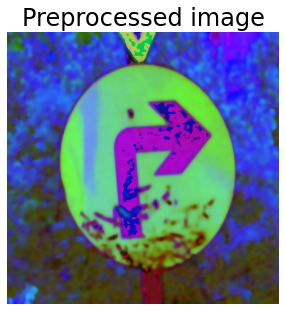

In [9]:
def preproccessing(image):
    # resize image to 500x500
    image = cv.resize(image, (500, 500))
    
    # convert image to HSV
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    
    # split HSV channels into H, S, V
    h, s, v = cv.split(hsv)
    
    # apply Histogram Equalization to V channel
    v = cv.equalizeHist(v)
    
    # merge H, S, V channels
    hsv = cv.merge((h, s, v))
    
    # Image blurring using median blur
    hsv = cv.medianBlur(hsv, 3)
    
    # Image smoothing using Bilateral Filter
    hsv = cv.bilateralFilter(hsv, 9, 75, 75)
    return hsv

plot(preproccessing(load_image()[0]), 'Preprocessed image')

## Thresholding by Red, Blue, Yellow 
### (Most common traffic signs colors)

idx = 1437


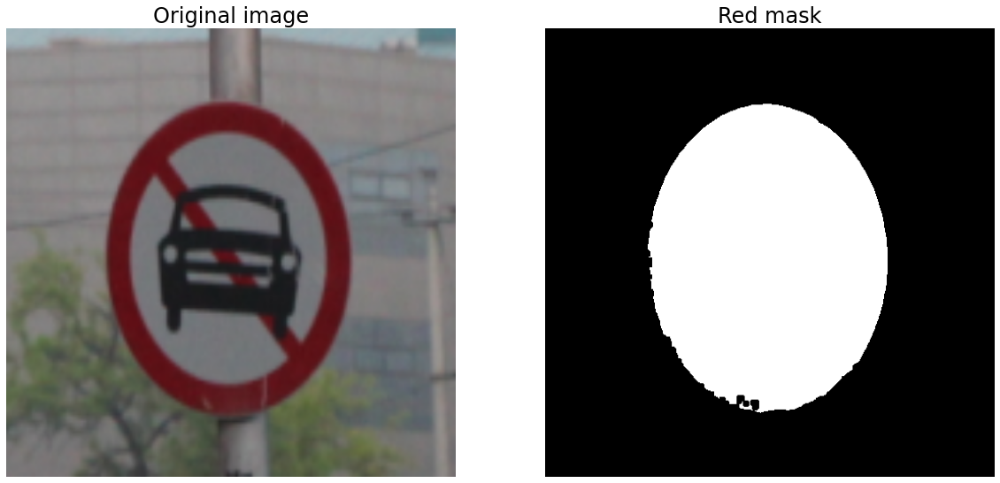

In [10]:
def red_mask(hsv):
    low_lower_red, low_upper_red = np.array([0, 120, 0]), np.array([7, 255, 255])

    high_lower_red, high_upper_red = np.array([160, 100, 0]), np.array([180, 255, 255])

    mask = cv.inRange(hsv, low_lower_red, low_upper_red) + cv.inRange(hsv, high_lower_red, high_upper_red)
    mask = cv.threshold(mask, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]
    
    kernel = np.ones((3, 3), np.uint8)
    mask = cv.erode(mask, np.ones((5, 5), np.uint8), iterations=1)

    mask = floodFill(remove_small_blob(mask))
    return mask
    
img, idx = load_image(1437)
print(f'idx = {idx}')

hsv = preproccessing(img)
rgb = cv.cvtColor(cv.resize(img, (500, 500)), cv.COLOR_BGR2RGB)

plot(rgb, img2=red_mask(hsv) , title='Original image', title2='Red mask')

idx = 1548


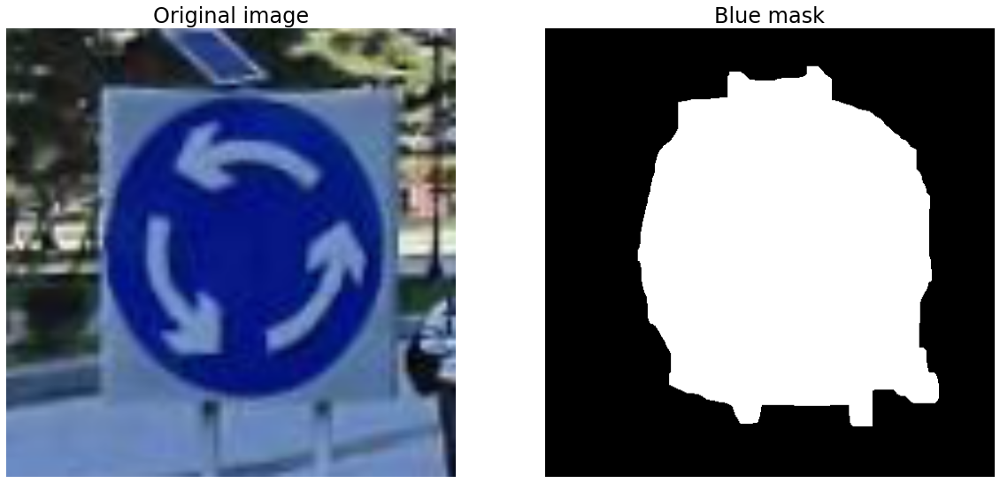

In [19]:
def blue_mask(hsv):
    lower_blue, upper_blue = np.array([79, 120, 0]), np.array([140, 255, 255])
    
    mask = cv.inRange(hsv, lower_blue, upper_blue)
    mask = cv.threshold(mask, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]

    kernel = np.ones((3, 3), np.uint8)
    mask = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel, iterations=3)
    
    mask = remove_small_blob(mask)
    mask = cv.morphologyEx(mask, cv.MORPH_DILATE, kernel, iterations=3)
    mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel, iterations=10)
    
    mask = remove_small_blob(floodFill(mask))
    
    return mask

img, idx = load_image(1548)
print(f'idx = {idx}')

hsv = preproccessing(img)
rgb = cv.cvtColor(cv.resize(img, (500, 500)), cv.COLOR_BGR2RGB)

plot(rgb, img2=blue_mask(hsv) , title='Original image', title2='Blue mask')

idx = 2964


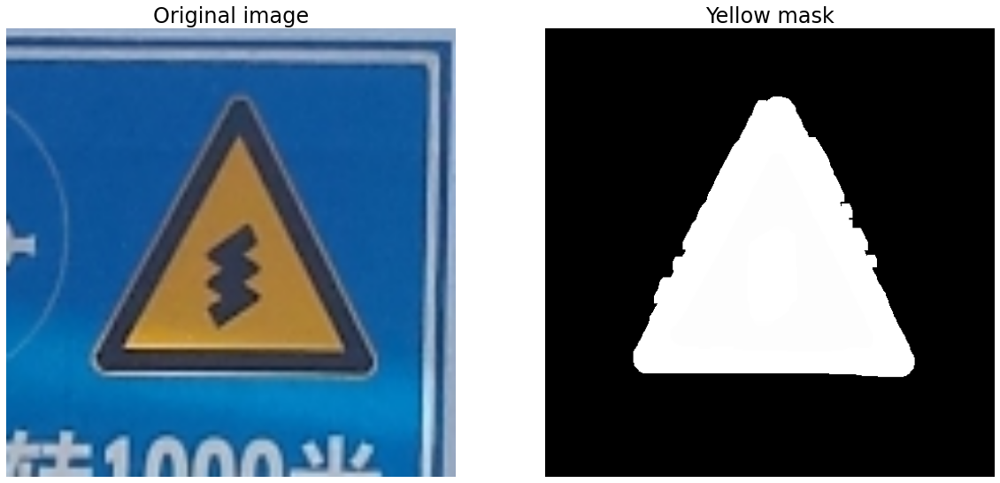

In [12]:
def yellow_mask(hsv):
    
    def black_mask(hsv):
        lower_black, upper_black = np.array([0, 20, 0]), np.array([180, 255, 45])
        
        mask = cv.inRange(hsv, lower_black, upper_black)
        mask = cv.threshold(mask, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]
        mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, np.ones((3, 3), np.uint8), iterations=2)
        mask = floodFill(remove_small_blob(mask))
        
        return cv.morphologyEx(mask, cv.MORPH_ERODE, np.ones((3, 3), np.uint8), iterations=2)
    
    
    lower_yellow, upper_yellow = np.array([10, 120, 20]), np.array([50, 255, 255])
    yellow_mask = cv.inRange(hsv, lower_yellow, upper_yellow)
    yellow_mask = cv.morphologyEx(yellow_mask, cv.MORPH_OPEN, np.ones((3, 3), np.uint8), iterations=4)
    yellow_mask = remove_small_blob(yellow_mask)
    
    yellow_copy = yellow_mask.copy()
    yellow_copy = cv.erode(yellow_copy, np.ones((5, 5), np.uint8), iterations=2)
    yellow_copy = cv.morphologyEx(yellow_copy, cv.MORPH_OPEN, np.ones((3, 3), np.uint8), iterations=2)
    yellow_copy = cv.dilate(yellow_copy, np.ones((3, 3), np.uint8), iterations=5)
    yellow_copy = cv.morphologyEx(yellow_copy, cv.MORPH_CLOSE, np.ones((3, 3), np.uint8), iterations=10)
    
    yellow_mask = yellow_mask + yellow_copy
    yellow_mask = remove_small_blob(yellow_mask)
    
    black_mask = black_mask(hsv)
    black_mask = cv.morphologyEx(black_mask, cv.MORPH_DILATE, np.ones((3, 3), np.uint8), iterations=4)

    return yellow_mask + black_mask

    
img, idx = load_image(2964)
print(f'idx = {idx}')

hsv = preproccessing(img)
rgb = cv.cvtColor(cv.resize(img, (500, 500)), cv.COLOR_BGR2RGB)

plot(rgb, img2=yellow_mask(hsv) , title='Original image', title2='Yellow mask')

idx = 3135


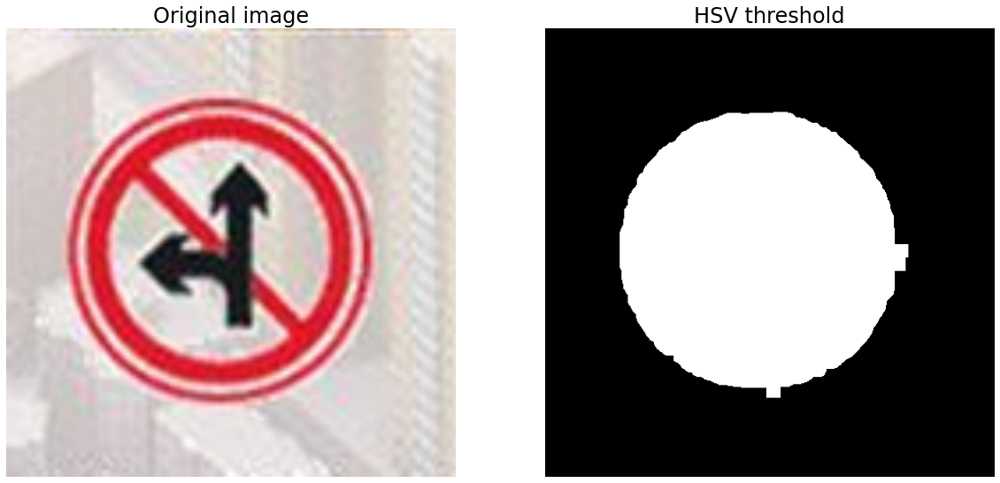

In [13]:
def hsv_threshold(hsv):
    h, s, v = cv.split(hsv)
    
    _, h_thresh = cv.threshold(h, 0, 180, cv.THRESH_BINARY + cv.THRESH_OTSU)
    _, s_thresh = cv.threshold(s, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    _, v_thresh = cv.threshold(v, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    
    h_thresh = floodFill(cv.bitwise_not(h_thresh))
    h_thresh = remove_small_blob(h_thresh)
    
    s_thresh = floodFill(s_thresh)
    s_thresh = cv.morphologyEx(s_thresh, cv.MORPH_ERODE, np.ones((3, 3), np.uint8), iterations=10)
    s_thresh = remove_small_blob(s_thresh)

    thresh = h_thresh * s_thresh
    thresh = cv.bitwise_and(thresh, cv.bitwise_not(v_thresh))
    thresh = cv.morphologyEx(thresh, cv.MORPH_DILATE, np.ones((5, 5), np.uint8), iterations=4)
    thresh = cv.morphologyEx(thresh, cv.MORPH_CLOSE, np.ones((3, 3), np.uint8), iterations=2)
    thresh = cv.morphologyEx(thresh, cv.MORPH_ERODE, np.ones((3, 3), np.uint8), iterations=2) 
    thresh = floodFill(remove_small_blob(thresh))
    return thresh

img, idx = load_image(3135)
print(f'idx = {idx}')

hsv = preproccessing(img)
rgb = cv.cvtColor(cv.resize(img, (500, 500)), cv.COLOR_BGR2RGB)

plot(rgb, img2=hsv_threshold(hsv) , title='Original image', title2='HSV threshold')

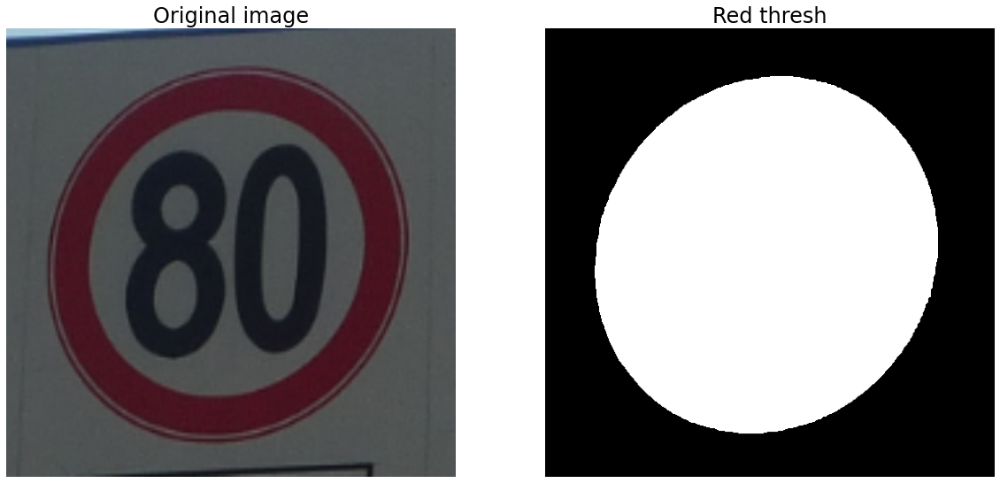

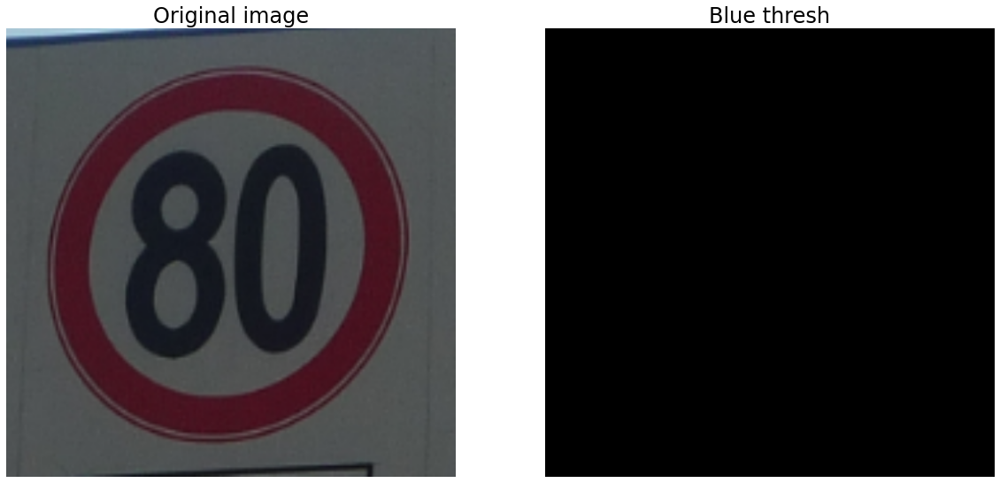

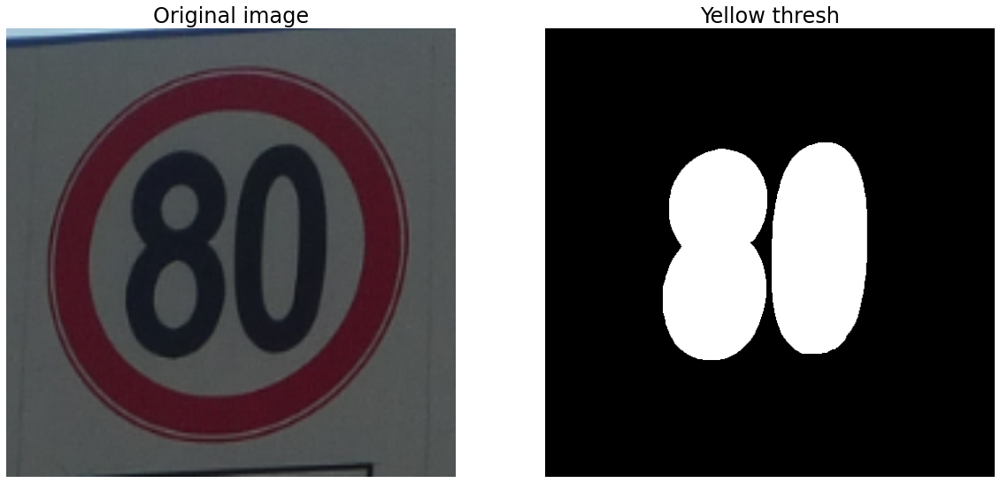

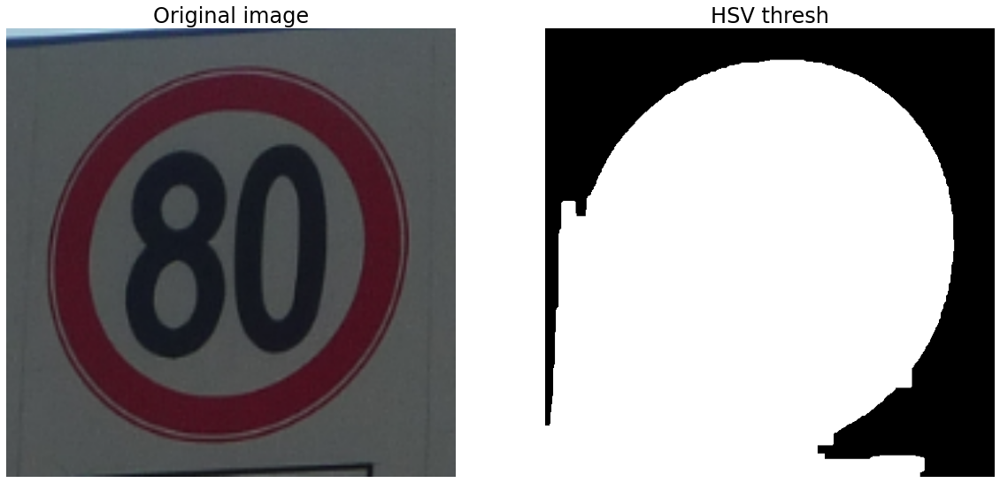

In [14]:
threshs = lambda hsv: [red_mask(hsv), blue_mask(hsv), yellow_mask(hsv), hsv_threshold(hsv)]
labels = ['Red thresh', 'Blue thresh', 'Yellow thresh', 'HSV thresh']


img, idx = load_image()

hsv = preproccessing(img)
rgb = cv.cvtColor(cv.resize(img, (500, 500)), cv.COLOR_BGR2RGB)

for thresh, label in zip(threshs(hsv), labels):
    plot(rgb, img2=thresh, title='Original image', title2=label)

# Segmenting

Number of contours = 4
Number of contours in Red thresh = 1
Number of contours in Blue thresh = 0
Number of contours in Yellow thresh = 0
Number of contours in HSV thresh = 1


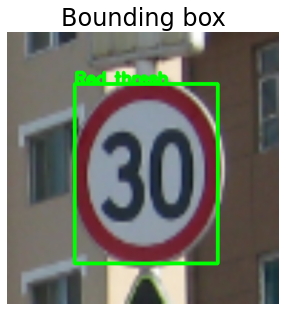

In [15]:
def get_contour(thresh):
    contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv.contourArea, reverse=True)
    return contours

threshs_contours = [get_contour(thresh) for thresh in threshs(preproccessing(load_image(2139)[0]))]

def compare_and_choose_contour(threshs_contours, verbose=False):
    
    if verbose:
        print(f'Number of contours = {len(threshs_contours)}')
        for i in range(len(threshs_contours)): print(f'Number of contours in {labels[i]} = {len(threshs_contours[i])}')

    contours = {label: threshs_contours[i] for i, label in enumerate(labels)}

    # each thresh with its own color
    colors = [(0, 0, 255), (255, 0, 0), (0, 255, 255), (255, 255, 255)]

    lbs = []
    cnts = []
    count = 0
    width, height = 500, 500

    for i, (label, contour) in enumerate(contours.items()):
        
        for cnt in contour:
            area = cv.contourArea(cnt)
            x, y, w, h = cv.boundingRect(cnt)
            if w!=width and h!=height and x>0 and y>0 and w>20 and h>20 and area>1000:
                cnts.append([cnt, label])
                count += 1


    if count == 0 or cnts == []:
        print('No bounding box found') if verbose else None
        return None
    else:
        largest_contour = max(cnts, key=lambda x: cv.contourArea(x[0]))[0]
        largest_label = max(cnts, key=lambda x: cv.contourArea(x[0]))[1]
        x, y, w, h = cv.boundingRect(largest_contour)
        return [x, y, w, h, largest_label]


img, idx = load_image(2139)
img = cv.resize(img, (500, 500))
hsv = preproccessing(img)

contour = compare_and_choose_contour([get_contour(thresh) for thresh in threshs(preproccessing(load_image(2139)[0]))], True)

if contour is not None:
    x, y, w, h, label = contour
    rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    cv.rectangle(rgb, (x, y), (x + w, y + h), (0, 255, 0), 5)
    cv.putText(rgb, label, (x, y), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 5)
    plot(rgb, title='Bounding box')

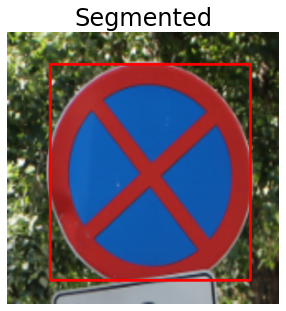

In [16]:
def segmentation(img):
    rgb = cv.cvtColor(cv.resize(img, (500, 500)).copy(), cv.COLOR_BGR2RGB)
    img = preproccessing(img)
    contours = [get_contour(thresh) for thresh in threshs(img)]
    
    x, y, w, h, label = compare_and_choose_contour(contours) if compare_and_choose_contour(contours) is not None else [0, 0, 0, 0, '']
    rgb = cv.rectangle(rgb, (x, y), (x + w, y + h), (255, 0, 0), 4)
    return [x, y, w, h], rgb


img, idx = load_image()

predBox, pred = segmentation(img)

plot(pred, title='Segmented')

# Evaluation

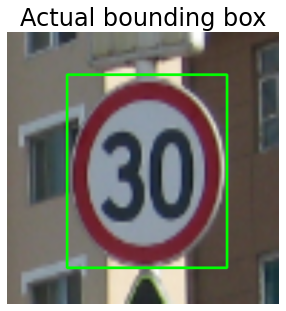

In [17]:
def actual_box(idx):
    img = load_image(idx)[0]
    height, width = img.shape[:2]
    x, y, w, h = data.iloc[idx]['x1'], data.iloc[idx]['y1'], data.iloc[idx]['x2'] - data.iloc[idx]['x1'], data.iloc[idx]['y2'] - data.iloc[idx]['y1']
    x, w = int(x * 500 / width), int(w * 500 / width)
    y, h = int(y * 500 / height), int(h * 500 / height)
    
    img = cv.resize(img, (500, 500))
    img = cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 4)
    return [x, y, w, h], img

_, img = actual_box(load_image(2139)[1])
plot(cv.cvtColor(img, cv.COLOR_BGR2RGB), title='Actual bounding box')

Image 69 accuracy: 81.08%	average accuracy: 86.93%[███████████████████ ] 98%
Average accuracy: 86.92649106623837%
Average time taken: 48.903869057145194 ms


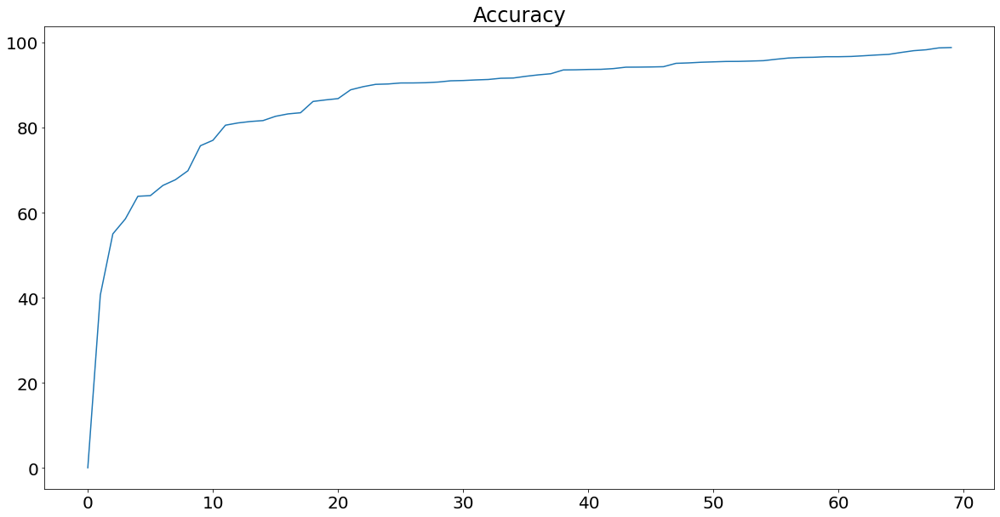

In [18]:
def intersection_over_union(pred, actual):
    x1, y1, w1, h1 = pred
    x2, y2, w2, h2 = actual
    xA = max(x1, x2)
    yA = max(y1, y2)
    xB = min(x1 + w1, x2 + w2)
    yB = min(y1 + h1, y2 + h2)
    
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (w1 + 1) * (h1 + 1)
    boxBArea = (w2 + 1) * (h2 + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou * 100

def accuracy(data, test=False):
    acc = []
    time_ms = []
    if test:
        # load all filename of images in test folder
        test_path = "test/"
        filename = [f for f in os.listdir(test_path) if os.path.isfile(os.path.join(test_path, f))]

        test_acc = []
        for i in range(len(filename)):
            start = time.perf_counter()
            img, idx = load_image(filename=filename[i])
            pred = segmentation(img)[0]
            time_ms.append((time.perf_counter() - start)*1000)
            actual = actual_box(idx)[0]
            iou = intersection_over_union(pred, actual)
            acc.append(iou)
            sys.stdout.write('\r')
            sys.stdout.write('Image {} accuracy: {:.2f}%\taverage accuracy: {:.2f}%'.format(i, iou, np.mean(acc)))
            sys.stdout.write("[%-20s] %d%%" % ('█'*int(i/len(filename)*20), 100*i/len(filename)))
            sys.stdout.flush()
        print(f'\nAverage accuracy: {np.mean(acc)}%')
        print(f'Average time taken: {np.mean(time_ms)} ms')
        return acc, time_ms
    else:
        for i in range(len(data)):
            start = time.perf_counter()
            img, idx = load_image(i)
            pred = segmentation(img)[0]
            time_ms.append((time.perf_counter() - start)*1000)
            actual = actual_box(idx)[0]
            iou = intersection_over_union(pred, actual)
            acc.append(iou)
            sys.stdout.write('\r')
            sys.stdout.write('Image {} accuracy: {:.2f}%\taverage accuracy: {:.2f}%'.format(i, iou, np.mean(acc)))
            sys.stdout.write("[%-20s] %d%%" % ('█'*int(i/len(data)*20), 100*i/len(data)))
            sys.stdout.flush()
        print(f'\nAverage accuracy: {np.mean(acc)}%')
        return acc, time_ms
    
def plot_acc(acc, title='Accuracy'):
    plt.figure(figsize=(20, 10))
    plt.title(title)
    plt.plot(np.sort(acc))
    plt.show()

acc, time_ms = accuracy(data, test=True)
plot_acc(acc, title='Accuracy')

# CNN Classifier

In [2]:
################# Parameters #####################
 
path = "tsrd-train" # folder with all the class folders
labelFile = 'Labels.csv' # file with all names of classes
batch_size_val=50  # how many to process together
steps_per_epoch_val=2000
epochs_val=10
imageDimesions = (32,32,3)
testRatio = 0.2    # if 1000 images split will 200 for testing
validationRatio = 0.2 # if 1000 images 20% of remaining 800 will be 160 for validation
###################################################

In [3]:
############################### Importing of the Images
count = 0
images = []
classNo = []
myList = os.listdir(path)
noOfClasses= 58


if '.DS_Store' in myList:
    myList.remove('.DS_Store')
print("Total Classes Detected:",noOfClasses)

print("Importing Classes.....")
for x in range (0,noOfClasses):
    for y in myList:
        if (int(y[:3]) == count):
            curImg = cv2.imread(path+"/"+y)
            curImg = cv2.resize(curImg, (imageDimesions[0],imageDimesions[1]))
            images.append(curImg)
            classNo.append(count)
    print(count, end =" ")
    count +=1
print(" ")
images = np.array(images)
classNo = np.array(classNo)


Total Classes Detected: 58
Importing Classes.....
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57  


In [4]:

############################### Split Data
X_train, X_test, y_train, y_test = train_test_split(images, classNo, test_size=testRatio)
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validationRatio)


############################### TO CHECK IF NUMBER OF IMAGES MATCHES TO NUMBER OF LABELS FOR EACH DATA SET
print("Data Shapes")
print("Train",end = "");print(X_train.shape,y_train.shape)
print("Validation",end = "");print(X_validation.shape,y_validation.shape)
print("Test",end = "");print(X_test.shape,y_test.shape)
assert(X_train.shape[0]==y_train.shape[0]), "The number of images in not equal to the number of lables in training set"
assert(X_validation.shape[0]==y_validation.shape[0]), "The number of images in not equal to the number of lables in validation set"
assert(X_test.shape[0]==y_test.shape[0]), "The number of images in not equal to the number of lables in test set"
assert(X_train.shape[1:]==(imageDimesions))," The dimesions of the Training images are wrong "
assert(X_validation.shape[1:]==(imageDimesions))," The dimesionas of the Validation images are wrong "
assert(X_test.shape[1:]==(imageDimesions))," The dimesionas of the Test images are wrong"



Data Shapes
Train(2668, 32, 32, 3) (2668,)
Validation(668, 32, 32, 3) (668,)
Test(834, 32, 32, 3) (834,)


data shape  (58, 2) <class 'pandas.core.frame.DataFrame'>


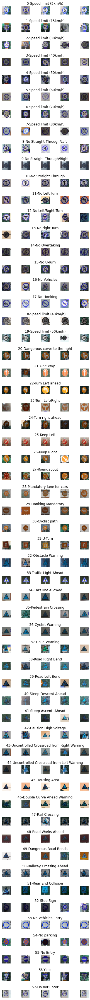

In [6]:

# READ CSV FILE
data=pd.read_csv(labelFile)
print("data shape ",data.shape,type(data))

#DISPLAY SOME SAMPLES IMAGES  OF ALL THE CLASSES
num_of_samples = []
cols = 5
num_classes = noOfClasses
fig, axs = plt.subplots(nrows=num_classes, ncols=cols, figsize=(5, 50))
fig.tight_layout()
for i in range(cols):
    for j,row in data.iterrows():
        x_selected = X_train[y_train == j]
        axs[j][i].imshow(x_selected[random.randint(0, len(x_selected)- 1), :, :], cmap=plt.get_cmap("gray"))
        axs[j][i].axis("off")
        if i == 2:
            axs[j][i].set_title(str(j)+ "-"+row["Name"])
            num_of_samples.append(len(x_selected))

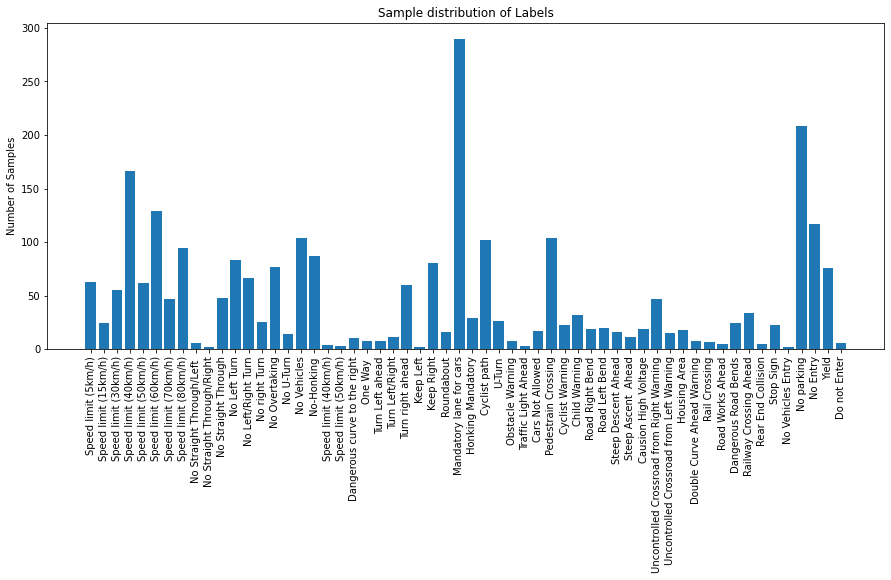

In [7]:
ref, n_samples = np.unique(y_train,return_index=False,return_inverse=False,return_counts=True)

labels_unique = []
label_signs = data.values[:, 1]  # fetch only sign names
for i in range(58):
    labels_unique.append(label_signs[i])

index = random.randint(0, len(X_train))

fig = plt.figure(figsize=(15, 6))
ax = fig.add_subplot(111)
ax.set_title('Sample distribution of Labels')
# ax.set_xlabel('Classes')
ax.set_xticks(np.arange(len(labels_unique)))
ax.set_xticklabels(labels_unique, rotation='vertical')
ax.set_ylabel('Number of Samples')
plt.bar(range(58), n_samples)
plt.show()

In [8]:

############################### PREPROCESSING THE IMAGES
 
def grayscale(img):
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return img
def equalize(img):
    img =cv2.equalizeHist(img)
    return img
def preprocessing(img):
    img = grayscale(img)     # CONVERT TO GRAYSCALE
    img = equalize(img)      # STANDARDIZE THE LIGHTING IN AN IMAGE
    img = img/255            # TO NORMALIZE VALUES BETWEEN 0 AND 1 INSTEAD OF 0 TO 255
    return img
 
X_train=np.array(list(map(preprocessing,X_train)))  # TO IRETATE AND PREPROCESS ALL IMAGES
X_validation=np.array(list(map(preprocessing,X_validation)))
X_test=np.array(list(map(preprocessing,X_test)))
 

In [9]:
############################### ADD A DEPTH OF 1
X_train=X_train.reshape(X_train.shape[0],X_train.shape[1],X_train.shape[2],1)
X_validation=X_validation.reshape(X_validation.shape[0],X_validation.shape[1],X_validation.shape[2],1)
X_test=X_test.reshape(X_test.shape[0],X_test.shape[1],X_test.shape[2],1)


In [10]:

# AUGMENTATAION OF IMAGES: TO MAKEIT MORE GENERIC
dataGen= ImageDataGenerator(width_shift_range=0.1,  # TO SHIFT THE IMAGE 10% OF THE WIDTH
                            height_shift_range=0.1, # TO SHIFT THE IMAGE 10% OF THE HEIGHT
                            zoom_range=0.2,  # 0.2 MEANS CAN GO FROM 0.8 TO 1.2
                            shear_range=0.1,  # MAGNITUDE OF SHEAR ANGLE
                            rotation_range=10)  # DEGREES
dataGen.fit(X_train)
batches= dataGen.flow(X_train,y_train,batch_size=20)  
X_batch,y_batch = next(batches)


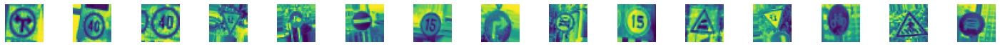

In [11]:
# DISPLAY THE AUGMENTED IMAGE SAMPLES
fig,axs=plt.subplots(1,15,figsize=(20,5))
fig.tight_layout()
 
for i in range(15):
    axs[i].imshow(X_batch[i].reshape(imageDimesions[0],imageDimesions[1]))
    axs[i].axis('off')
plt.show()

In [12]:
# add augmented data to the training set
X_train = np.concatenate((X_train, X_batch), axis=0)
y_train = np.concatenate((y_train, y_batch), axis=0)

In [13]:
# Converts a class vector (integers) to binary class matrix.
y_train = to_categorical(y_train,noOfClasses)
y_validation = to_categorical(y_validation,noOfClasses)
y_test = to_categorical(y_test,noOfClasses)

In [14]:
############################### CONVOLUTION NEURAL NETWORK MODEL
import keras
from keras.models import Sequential,Model
from tensorflow.python.keras.models import Input
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import LeakyReLU
from keras.callbacks import EarlyStopping

#  enhanced CNN

def myModel():
    model = Sequential()
    
    # w1 convolutional layer,activation, pooling
    model.add(Conv2D(32, kernel_size=(3, 3),activation='linear',input_shape=(imageDimesions[0],imageDimesions[1],1),padding='same'))
    model.add(LeakyReLU(alpha=0.1))
    model.add(MaxPooling2D((2, 2),padding='same'))
    # w2 convolutional layer,activation, pooling
    model.add(Conv2D(64, (3, 3), activation='linear',padding='same'))
    model.add(LeakyReLU(alpha=0.1))
    model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    # w3 convolutional layer,activation, pooling
    model.add(Conv2D(128, (3, 3), activation='linear',padding='same'))
    model.add(LeakyReLU(alpha=0.1))                  
    model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    # fully connected layer
    model.add(Flatten())
    model.add(Dense(128, activation='linear'))
    model.add(LeakyReLU(alpha=0.1))       
    # adding output layer
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(),metrics=['accuracy'])

    return model

# ############################### TRAIN
model = myModel()
print(model.summary())
earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='min')
history=model.fit(dataGen.flow(X_train,y_train,batch_size=batch_size_val),steps_per_epoch=int(2668/batch_size_val),epochs=100,validation_data=(X_validation,y_validation),validation_steps=int(668/batch_size_val),callbacks=[earlyStopping],shuffle=1)
 
print(X_train.shape,X_test.shape,X_validation.shape)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        320       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                    

2022-09-11 23:24:24.258768: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         73856     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 4, 4, 128)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 58)                7482      
          

INFO:tensorflow:Assets written to: ram://d783711c-9c5c-4209-badc-10e585d1831a/assets


INFO:tensorflow:Assets written to: ram://d783711c-9c5c-4209-badc-10e585d1831a/assets


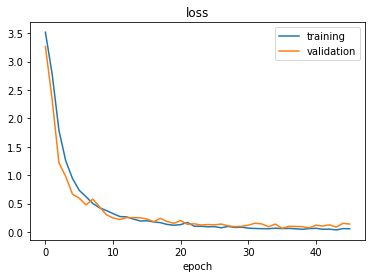

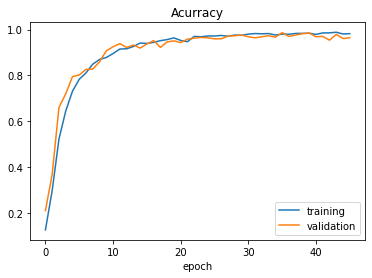

Test Score: 0.23858118057250977
Test Accuracy: 0.9544364213943481


In [16]:
############################### PLOT
plt.figure(1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('loss')
plt.xlabel('epoch')
plt.figure(2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['training','validation'])
plt.title('Acurracy')
plt.xlabel('epoch')
plt.show()
score =model.evaluate(X_test,y_test,verbose=0)
print('Test Score:',score[0])
print('Test Accuracy:',score[1])


In [18]:
######  Testing Process
test_path = os.listdir('test')
test_images = []

for y in test_path:
    curImg = cv2.imread('test'+"/"+y)
    curImg = cv2.cvtColor(curImg,cv2.COLOR_BGR2RGB)
    # curImg = cv2.resize(curImg, (imageDimesions[0],imageDimesions[1]))
    test_images.append(curImg)


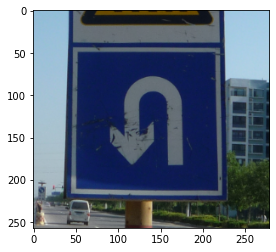

In [19]:
import random
plt.imshow(test_images[random.randint(0,69)])
plt.show()


In [20]:
from cgi import test
import numpy as np
import cv2
import pickle
 
threshold = 0.5   #PROBABLITY THRESHOLD

def grayscale(img):
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return img
def equalize(img):
    img =cv2.equalizeHist(img)
    return img
def preprocessing(img):
    img = grayscale(img)
    img = equalize(img)
    img = img/255
    return img

def getCalssName(classNo):
    if   classNo == 0: return 'Speed limit (5km/h)'
    elif classNo == 1: return 'Speed limit (15km/h)'
    elif classNo == 2: return 'Speed limit (30km/h)'
    elif classNo == 3: return 'Speed limit (40km/h)'
    elif classNo == 4: return 'Speed limit (50km/h)'
    elif classNo == 5: return 'Speed limit (60km/h)'
    elif classNo == 6: return 'Speed limit (70km/h)'
    elif classNo == 7: return 'Speed limit (80km/h)'
    elif classNo == 8: return 'No Straight Through/Left '
    elif classNo == 9: return 'No Straight Through/Right'
    elif classNo == 10: return 'No Straight Through'
    elif classNo == 11: return 'No Left Turn'
    elif classNo == 12: return 'No Left/Right Turn'
    elif classNo == 13: return 'No right Turn'
    elif classNo == 14: return 'No Overtaking'
    elif classNo == 15: return 'No U-Turn'
    elif classNo == 16: return 'No Vehicles'
    elif classNo == 17: return 'No-Honking'
    elif classNo == 18: return 'Speed limit (40km/h)'
    elif classNo == 19: return 'Speed limit (50km/h)'
    elif classNo == 20: return 'Dangerous curve to the right'
    elif classNo == 21: return 'One Way '
    elif classNo == 22: return 'Turn Left ahead'
    elif classNo == 23: return 'Turn Left/Right'
    elif classNo == 24: return 'Turn right ahead'
    elif classNo == 25: return 'Keep Left'
    elif classNo == 26: return 'Keep Right'
    elif classNo == 27: return 'Roundabout'
    elif classNo == 28: return 'Mandatory lane for cars'
    elif classNo == 29: return 'Honking Mandatory'
    elif classNo == 30: return 'Cyclist path'
    elif classNo == 31: return 'U-Turn'
    elif classNo == 32: return 'Obstacle Warning'
    elif classNo == 33: return 'Traffic Light Ahead'
    elif classNo == 34: return 'Cars Not Allowed'
    elif classNo == 35: return 'Pedestrain Crossing'
    elif classNo == 36: return 'Cyclist Warning'
    elif classNo == 37: return 'Child Warning'
    elif classNo == 38: return 'Road Right Bend'
    elif classNo == 39: return 'Road Left Bend'
    elif classNo == 40: return 'Steep Descent Ahead'
    elif classNo == 41: return 'Steep Ascent  Ahead'
    elif classNo == 42: return 'Causion High Voltage'
    elif classNo == 43: return 'Uncontrolled Crossroad from Right Warning'
    elif classNo == 44: return 'Uncontrolled Crossroad from Left Warning'
    elif classNo == 45: return 'Housing Area'
    elif classNo == 46: return 'Double Curve Ahead Warning'
    elif classNo == 47: return 'Rail Crossing'
    elif classNo == 48: return 'Road Works Ahead'
    elif classNo == 49: return 'Dangerous Road Bends'
    elif classNo == 50: return 'Railway Crossing Ahead'
    elif classNo == 51: return 'Rear End Collision'
    elif classNo == 52: return 'Stop Sign'
    elif classNo == 53: return 'No Vehicles Entry'
    elif classNo == 54: return 'No parking'
    elif classNo == 55: return 'No Entry'
    elif classNo == 56: return 'Yield'
    elif classNo == 57: return 'Do not Enter'

1/1 [==============================] - 0s 107ms/step


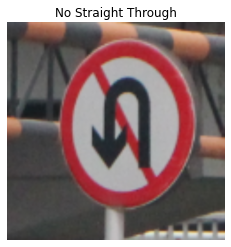

Accuracy : 96.29 %
Class No:  [10]
1/1 [==============================] - 0s 19ms/step


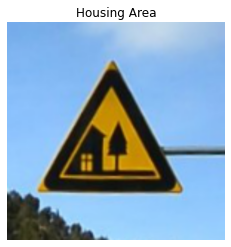

Accuracy : 99.99 %
Class No:  [45]
1/1 [==============================] - 0s 17ms/step


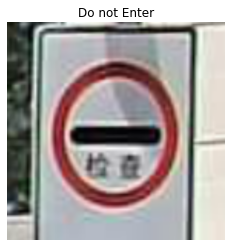

Accuracy : 99.97 %
Class No:  [57]
1/1 [==============================] - 0s 16ms/step


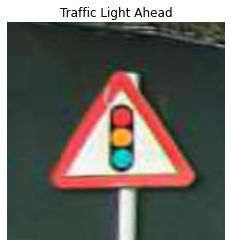

Accuracy : 99.93 %
Class No:  [33]
1/1 [==============================] - 0s 17ms/step


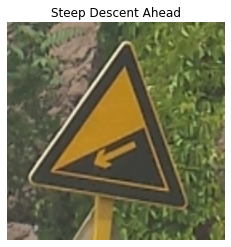

Accuracy : 100.00 %
Class No:  [40]
1/1 [==============================] - 0s 16ms/step


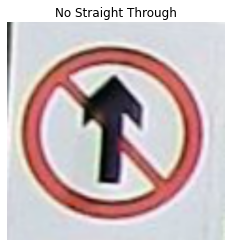

Accuracy : 100.00 %
Class No:  [10]
1/1 [==============================] - 0s 16ms/step


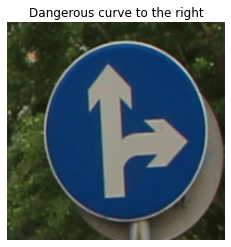

Accuracy : 100.00 %
Class No:  [20]
1/1 [==============================] - 0s 17ms/step


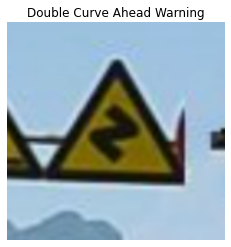

Accuracy : 100.00 %
Class No:  [46]
1/1 [==============================] - 0s 16ms/step


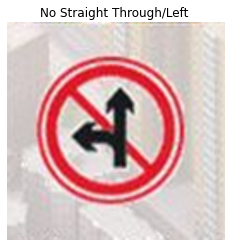

Accuracy : 99.99 %
Class No:  [8]
1/1 [==============================] - 0s 16ms/step


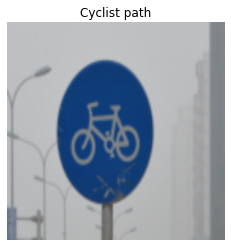

Accuracy : 77.03 %
Class No:  [30]
1/1 [==============================] - 0s 16ms/step


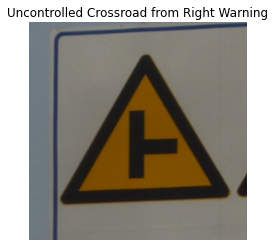

Accuracy : 99.86 %
Class No:  [43]
1/1 [==============================] - 0s 16ms/step


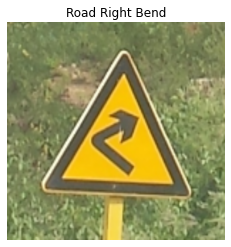

Accuracy : 100.00 %
Class No:  [38]
1/1 [==============================] - 0s 16ms/step


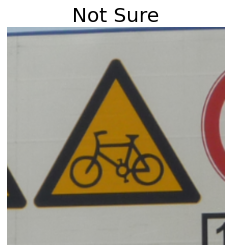

Accuracy : 48.97 %
Class No:  [35]
1/1 [==============================] - 0s 19ms/step


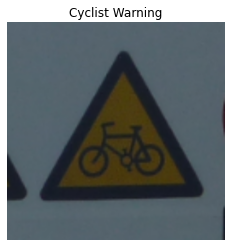

Accuracy : 86.68 %
Class No:  [36]
1/1 [==============================] - 0s 16ms/step


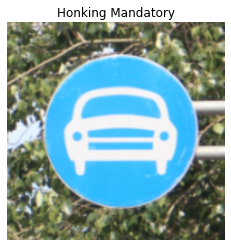

Accuracy : 96.17 %
Class No:  [29]
1/1 [==============================] - 0s 16ms/step


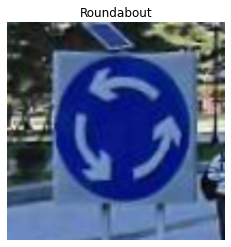

Accuracy : 99.99 %
Class No:  [27]
1/1 [==============================] - 0s 65ms/step


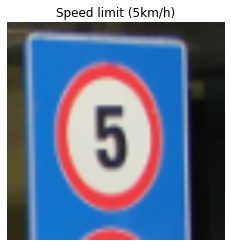

Accuracy : 99.94 %
Class No:  [0]
1/1 [==============================] - 0s 21ms/step


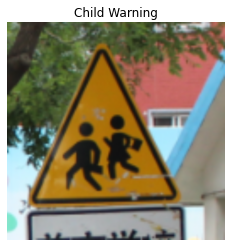

Accuracy : 99.86 %
Class No:  [37]
1/1 [==============================] - 0s 17ms/step


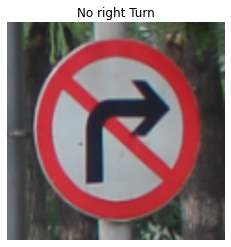

Accuracy : 100.00 %
Class No:  [13]
1/1 [==============================] - 0s 16ms/step


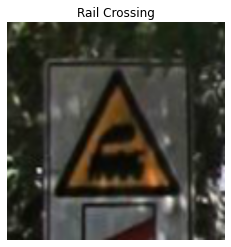

Accuracy : 100.00 %
Class No:  [47]
1/1 [==============================] - 0s 17ms/step


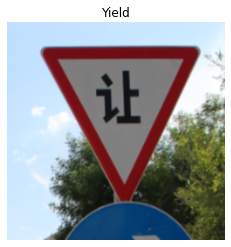

Accuracy : 100.00 %
Class No:  [56]
1/1 [==============================] - 0s 21ms/step


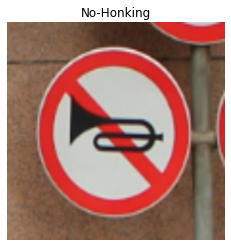

Accuracy : 100.00 %
Class No:  [17]
1/1 [==============================] - 0s 23ms/step


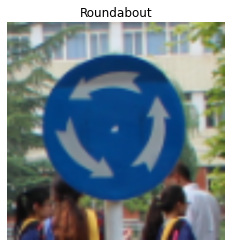

Accuracy : 99.97 %
Class No:  [27]
1/1 [==============================] - 0s 52ms/step


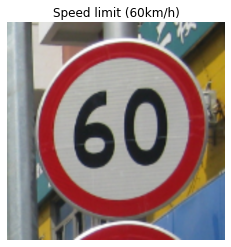

Accuracy : 100.00 %
Class No:  [5]
1/1 [==============================] - 0s 17ms/step


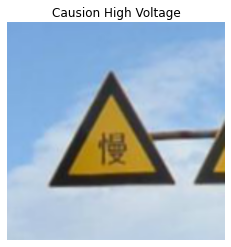

Accuracy : 99.99 %
Class No:  [42]
1/1 [==============================] - 0s 17ms/step


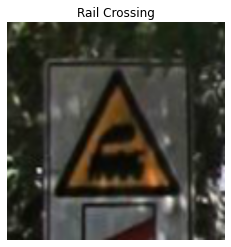

Accuracy : 100.00 %
Class No:  [47]
1/1 [==============================] - 0s 16ms/step


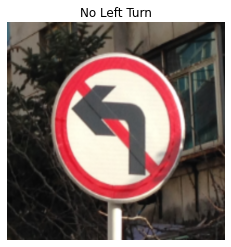

Accuracy : 100.00 %
Class No:  [11]
1/1 [==============================] - 0s 17ms/step


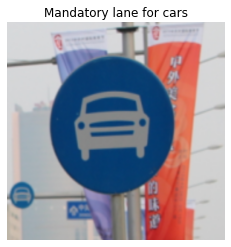

Accuracy : 100.00 %
Class No:  [28]
1/1 [==============================] - 0s 18ms/step


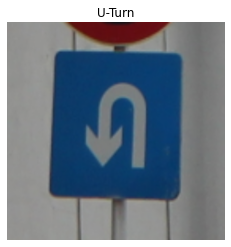

Accuracy : 99.38 %
Class No:  [31]
1/1 [==============================] - 0s 16ms/step


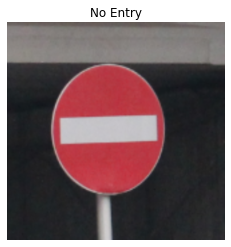

Accuracy : 100.00 %
Class No:  [55]
1/1 [==============================] - 0s 49ms/step


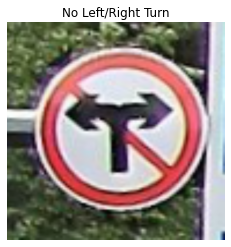

Accuracy : 100.00 %
Class No:  [12]
1/1 [==============================] - 0s 75ms/step


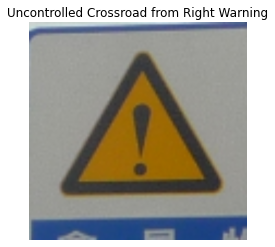

Accuracy : 58.28 %
Class No:  [43]
1/1 [==============================] - 0s 22ms/step


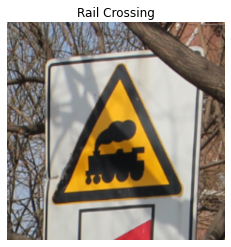

Accuracy : 99.85 %
Class No:  [47]
1/1 [==============================] - 0s 17ms/step


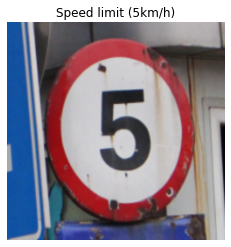

Accuracy : 99.99 %
Class No:  [0]
1/1 [==============================] - 0s 18ms/step


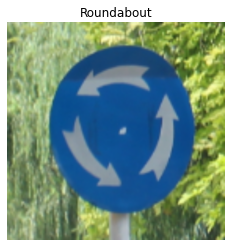

Accuracy : 100.00 %
Class No:  [27]
1/1 [==============================] - 0s 16ms/step


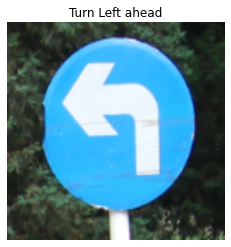

Accuracy : 99.99 %
Class No:  [22]
1/1 [==============================] - 0s 16ms/step


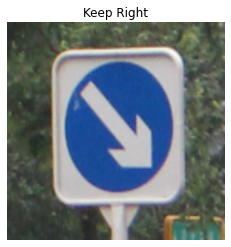

Accuracy : 100.00 %
Class No:  [26]
1/1 [==============================] - 0s 16ms/step


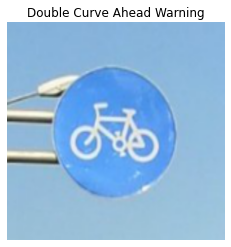

Accuracy : 85.31 %
Class No:  [46]
1/1 [==============================] - 0s 18ms/step


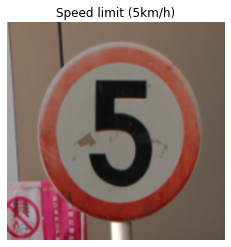

Accuracy : 100.00 %
Class No:  [0]
1/1 [==============================] - 0s 17ms/step


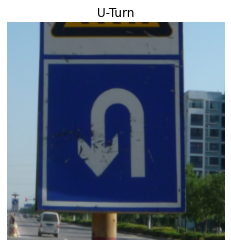

Accuracy : 98.34 %
Class No:  [31]
1/1 [==============================] - 0s 84ms/step


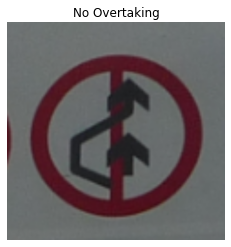

Accuracy : 100.00 %
Class No:  [14]
1/1 [==============================] - 0s 17ms/step


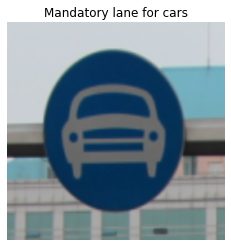

Accuracy : 100.00 %
Class No:  [28]
1/1 [==============================] - 0s 21ms/step


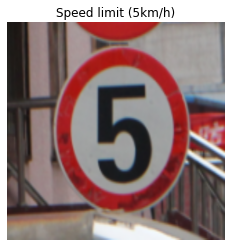

Accuracy : 99.99 %
Class No:  [0]
1/1 [==============================] - 0s 19ms/step


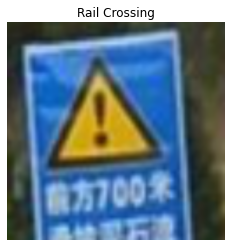

Accuracy : 92.50 %
Class No:  [47]
1/1 [==============================] - 0s 17ms/step


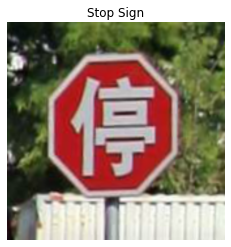

Accuracy : 100.00 %
Class No:  [52]
1/1 [==============================] - 0s 16ms/step


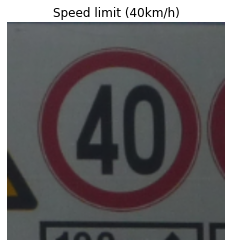

Accuracy : 100.00 %
Class No:  [3]
1/1 [==============================] - 0s 15ms/step


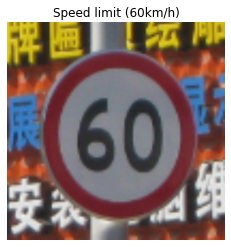

Accuracy : 99.99 %
Class No:  [5]
1/1 [==============================] - 0s 16ms/step


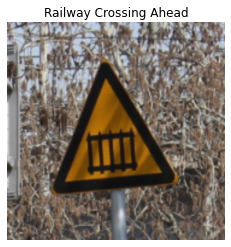

Accuracy : 100.00 %
Class No:  [50]
1/1 [==============================] - 0s 16ms/step


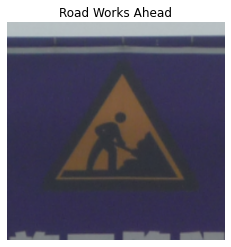

Accuracy : 99.03 %
Class No:  [48]
1/1 [==============================] - 0s 18ms/step


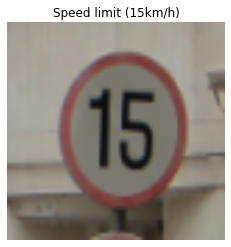

Accuracy : 97.52 %
Class No:  [1]
1/1 [==============================] - 0s 17ms/step


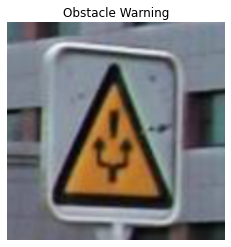

Accuracy : 99.89 %
Class No:  [32]
1/1 [==============================] - 0s 60ms/step


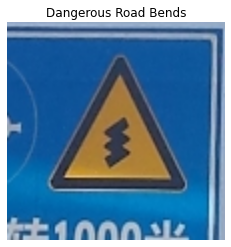

Accuracy : 99.94 %
Class No:  [49]
1/1 [==============================] - 0s 15ms/step


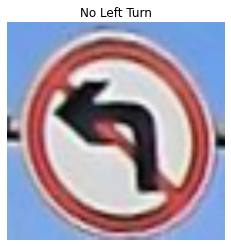

Accuracy : 100.00 %
Class No:  [11]
1/1 [==============================] - 0s 22ms/step


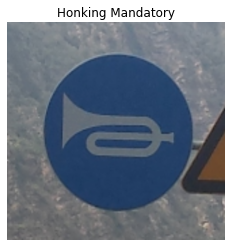

Accuracy : 99.85 %
Class No:  [29]
1/1 [==============================] - 0s 17ms/step


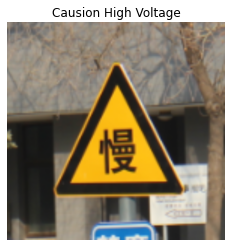

Accuracy : 99.72 %
Class No:  [42]
1/1 [==============================] - 0s 81ms/step


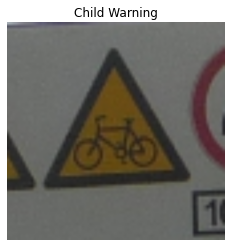

Accuracy : 90.89 %
Class No:  [37]
1/1 [==============================] - 0s 18ms/step


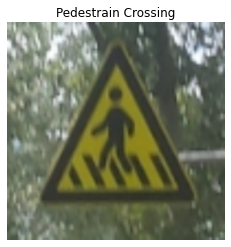

Accuracy : 99.88 %
Class No:  [35]
1/1 [==============================] - 0s 18ms/step


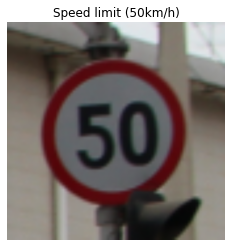

Accuracy : 82.09 %
Class No:  [4]
1/1 [==============================] - 0s 17ms/step


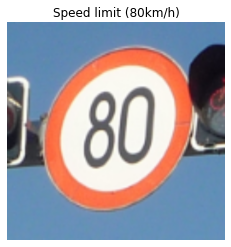

Accuracy : 99.69 %
Class No:  [7]
1/1 [==============================] - 0s 17ms/step


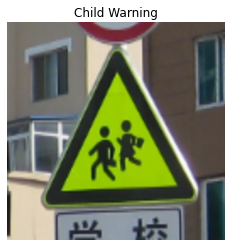

Accuracy : 99.97 %
Class No:  [37]
1/1 [==============================] - 0s 17ms/step


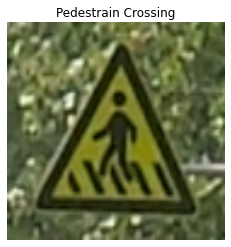

Accuracy : 99.95 %
Class No:  [35]
1/1 [==============================] - 0s 94ms/step


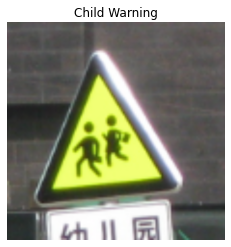

Accuracy : 100.00 %
Class No:  [37]
1/1 [==============================] - 0s 21ms/step


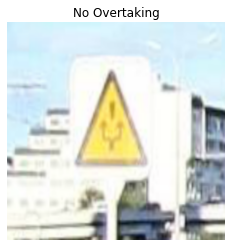

Accuracy : 97.66 %
Class No:  [14]
1/1 [==============================] - 0s 17ms/step


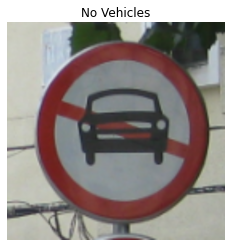

Accuracy : 99.97 %
Class No:  [16]
1/1 [==============================] - 0s 80ms/step


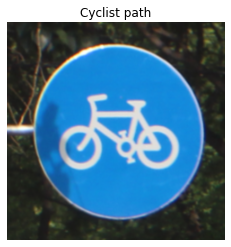

Accuracy : 99.99 %
Class No:  [30]
1/1 [==============================] - 0s 19ms/step


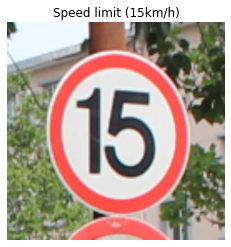

Accuracy : 100.00 %
Class No:  [1]
1/1 [==============================] - 0s 16ms/step


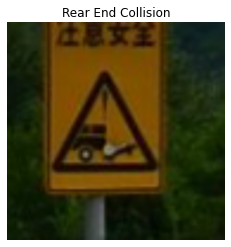

Accuracy : 99.92 %
Class No:  [51]
1/1 [==============================] - 0s 19ms/step


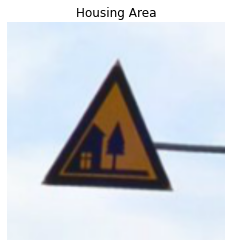

Accuracy : 99.90 %
Class No:  [45]
1/1 [==============================] - 0s 29ms/step


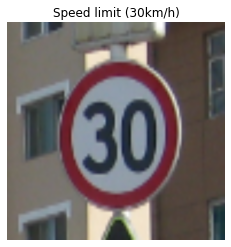

Accuracy : 100.00 %
Class No:  [2]


In [21]:
for i in range(0,69):
# PROCESS IMAGE
    img = np.asarray(test_images[i])
    img = cv2.resize(img, (32, 32))
    img = preprocessing(img)
    img = img.reshape(1, 32, 32, 1)

    # PREDICT IMAGE
    predictions = model.predict(img)
    # arg max
    classIndex = np.argmax(predictions,axis=1)

    probabilityValue =np.amax(predictions)

    image_test = np.asarray(test_images[i])
    image_test = cv2.resize(image_test, (500, 500))
    
    if probabilityValue > threshold:
        plt.imshow(image_test)
        plt.axis('off')
        plt.title(getCalssName(classIndex))
        plt.show()
    
    else:
        plt.imshow(image_test)
        plt.title("Not Sure",fontsize=20)
        plt.axis('off')
        plt.show()

    print("Accuracy :","{:.2f}".format(probabilityValue*100),"%")
    print("Class No: ",classIndex)